Для инвесторов из фонда «Shut Up and Take My Money» проведем анализ для инвестирования в область общественного питания в Москве. Подготовим исследование рынка Москвы, найдем интересные особенности, которые в будущем помогут в выборе подходящего инвесторам места.
Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. 

1. Загрузим данные 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px 
import seaborn as sns
sns.set(rc={'figure.figsize':(10, 8)})
import requests
import json
import scipy.stats as stats
from scipy import stats as st
from pandas.io.json import json_normalize
from pprint import pprint
import math
import numpy as np

In [2]:
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:,.2f}'.format

In [3]:
data = pd.read_csv('/datasets/moscow_places.csv')

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


_У нас имеется 8406 заведений по москве, рзбитыхпо районам, есть все данные по адресам, рейтингам, категориям, округам, сетям. В остальных встречаются пропуски._

2. Выполненим переработку данных.


In [6]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Пропуски лучше не заменять их слишком большое колличиство и это может отразиться на результате.

In [7]:
pd.DataFrame(round(data.isna().mean()*100,)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


In [8]:
data.duplicated().sum()

0

Явных дубликатов нет.

In [9]:
d = data['name'].unique()
sorted(d)

['#КешбэкКафе',
 '+39 Pizzeria Mozzarella bar',
 '1 Этаж',
 '1-я Креветочная',
 '10 Идеальных Пицц',
 '1001 Ночь',
 '100ловая',
 '100лоффка',
 '13',
 '13 Chef doner',
 '15 Kitchen+Bar',
 '15-й Шар',
 '16 Июня',
 '16 Тонн',
 '18 Грамм',
 '1901 Comfort Food Zone',
 '1у',
 '2 Типа',
 '2-й Этаж',
 '2046',
 '21 Век',
 '22 Акра Кофе&Хлеб',
 '2U-Ту-Ю',
 '3 Ступени',
 '351 Bar',
 '4 Сезона',
 '4.2. Bar',
 '4/1 Restaurant',
 '42 Coffee Shop',
 '47',
 '495',
 '4friends Coffee',
 '4tuna Cafe&Grill',
 '5 Stars Coffee',
 '55.709201, 37.392257',
 '6 Am Bread Kitchen',
 '6 Рукопожатий',
 '69 раков',
 '7 Сэндвичей',
 '7 элемент',
 '7/12',
 '8 Oz',
 '8 Вафель',
 '8 Зёрен',
 '8 Пончиков',
 '800°с Contemporary Steak',
 '8bit Pizza',
 '9 Bar Coffe',
 '9 Bar Coffee',
 '9 Зёрен',
 'A-cafe',
 'ABC Coffee Roasters',
 'ABC coffee roasters',
 'Acai Family',
 'Accent',
 "Adam's Chicken",
 'Adria Mare',
 'Ahava',
 'Air Coffee',
 'Al Halal',
 'Al33 Пиццерия бар Боттега',
 'All Day',
 'Alma',
 'Alternative coffee',

In [10]:
data['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

Мы имеем данные по общепитам, разбитые по районам (9 районов), указанием точки на карте, средним чеком, ценовым сегментом(4 сегмента), средним чеком, и адресом. Имеется пропуски в чесах работы, ценовом сегменте, среднем чеке, количестве посадочных мест. нет дубликатов.

In [11]:
#Создайте столбец street с названиями улиц из столбца с адресом.
data['street'] = data['address'].str.split(',').str[1]
data['street']

0                  улица Дыбенко
1                  улица Дыбенко
2             Клязьминская улица
3        улица Маршала Федоренко
4            Правобережная улица
                  ...           
8401           Профсоюзная улица
8402       Пролетарский проспект
8403            Люблинская улица
8404            Люблинская улица
8405         Россошанский проезд
Name: street, Length: 8406, dtype: object

In [12]:
#Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
data['is_24_7'] = data['hours'].str.contains('ежедневно, круглосуточно', case=False, na=False)

In [13]:
#data = data.dropna(subset=['middle_avg_bill', 'middle_coffee_cup', 'avg_bill']) 
data[data['is_24_7'].isna()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7


In [14]:
data[data['name'].str.contains('Домино')]['name'].unique() 

array(["Домино'с Пицца", 'Доминос пицца', "Домино'с пицца", "Домино'с"],
      dtype=object)

In [15]:
#приведем все названия к одному типу
#data['locality_name'] = data['locality_name'].str.lower()
data['name'] = data['name'].str.replace("Доминос пицца", "Домино'с Пицца")
data['name'] = data['name'].str.replace("Домино'с", "Домино'с Пицца")
data['name'] = data['name'].str.replace("Drive Café", "Drive Cafe")

In [16]:
#теперь приведем все буквы к нижнему регистру

data_dup = data[['name', 'address']]

data_dup = data_dup.applymap(str.lower)

dup_1 = data_dup[data_dup.duplicated(subset=['name', 'address'], keep=False)]

dup_1
#Нашли 4 дубликата


,name,address
189,кафе,"москва, парк ангарские пруды"
215,кафе,"москва, парк ангарские пруды"
1430,more poke,"москва, волоколамское шоссе, 11, стр. 2"
1511,more poke,"москва, волоколамское шоссе, 11, стр. 2"
2211,раковарня клешни и хвосты,"москва, проспект мира, 118"
2420,раковарня клешни и хвосты,"москва, проспект мира, 118"
3091,хлеб да выпечка,"москва, ярцевская улица, 19"
3109,хлеб да выпечка,"москва, ярцевская улица, 19"


In [17]:

# ищем дубликаты и записываем их индексы в лист

dup_1 = data_dup[data_dup.duplicated(subset=['name', 'address'])]

dup_1.index.tolist() 

#удалим строки с индексом содержащие дубликаты

data = data[~data.index.isin(dup_1.index.tolist())]

data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8402 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   int64  
 13  seats              4792 non-null   float64
 14  street             8402 non-null   object 
 15  is_24_7            8402 non-null   bool   
dtypes: bool(1), float64(6), 

3. Анализ данных

3.1. Категории

In [18]:
import plotly.express as px
from plotly import graph_objects as go
# готовим данные для графика
data_category = pd.DataFrame(data['category'].value_counts()).reset_index()

fig = px.bar(
    data_category, 
    x='index', 
    y='category', 
    color='index', 
    title='Категории заведений',
    text='category'
)
fig.update_xaxes(tickangle=45)
fig.update_xaxes(title_text=' Категории') # подпись для оси X
fig.update_yaxes(title_text='Колличество') # подпись для оси Y
fig.show() 

 _Судя по графику "кафе" всех чаще можно встретить в Москве, за ним следуют "рестораны"(ну это же Москва;)), на 3м месте "кофейни"(кофе самый распространенный напиток в "городе которы не спит"). Всех меньше "булочных" и "столовых".(это уже не СССР)_

3.2. Посадочные места.

In [19]:
data_seats = data.pivot_table(index='seats', values='name', aggfunc='count').sort_values('name', ascending=False)
data_seats=data_seats.head(10)

In [20]:
data_seats

,name
seats,
40.00,253
100.00,213
60.00,175
50.00,168
80.00,160
120.00,141
0.00,136
30.00,128
45.00,127


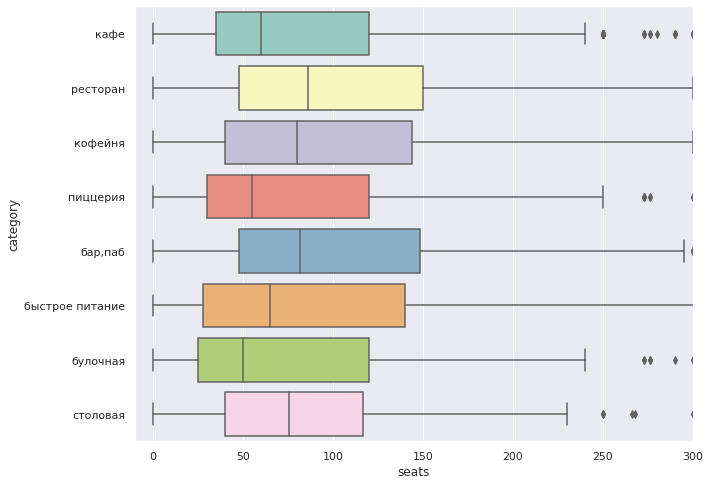

In [21]:
ax = sns.boxplot(x='seats', y='category', data=data, palette="Set3")
ax.set_xlim(-10,300)
plt.show()

_Как мы видим из графика и таблицы всех больше заведени с посадочными местами на 40 персон, затем на 100, на 60, на 50 и на 80 - это первая 5ка. Меньше всеговтречаюся в москве заведения более 100 посадочных мест(есть определенные всплески на круглое число мест, такие как 120, 150, 160, 180)._

__Новый вывод__

Как видно на графике самое меньшая медиана у болочных, потом идут кафе и пиццерии (где люди долго не едят). Самая большая медиана у ресторанов(также самые большие выбросы).

In [22]:
data_seats_2 = data.groupby('category', as_index=False)['seats'].agg('median')
data_seats_2 = data_seats_2.sort_values('seats', ascending=False)
data_seats_2

,category,seats
6,ресторан,86.00
0,"бар,паб",82.00
4,кофейня,80.00
7,столовая,75.50
2,быстрое питание,65.00
3,кафе,60.00
5,пиццерия,55.00
1,булочная,50.00


3.3. Сетевые/не сетевые.

In [23]:

# готовим данные для графика
data_chain = pd.DataFrame(data['chain'].value_counts()).reset_index()
#data_chain['index'] = data_chain['index'].astype('str')
#data_chain['index'] = data_chain['index'].str.replace({'0':'несетевое', '1':'сетевое'})

# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=data_chain['index'],# указываем значения, которые появятся на метках сегментов
                             values=data_chain['chain'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Сетевые\не сетевые', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
)

fig.show() # выводим график

In [24]:
data_chain

,index,chain
0,0,5199
1,1,3203


_Не сетевых почти в 2 разабольше_

Как я не крутила,в ошибку выдает((

3.4. Какие чаще сетевые.

In [25]:
data_chain_cat = data.groupby('category').agg({'chain' : 'sum', 'name' : 'count'}).reset_index()
data_chain_cat.columns = ['category', 'chain', 'total']
data_chain_cat = data_chain_cat.sort_values('chain', ascending=False)

data_chain_cat.head()

,category,chain,total
3,кафе,779,2376
6,ресторан,729,2042
4,кофейня,720,1413
5,пиццерия,330,633
2,быстрое питание,232,603


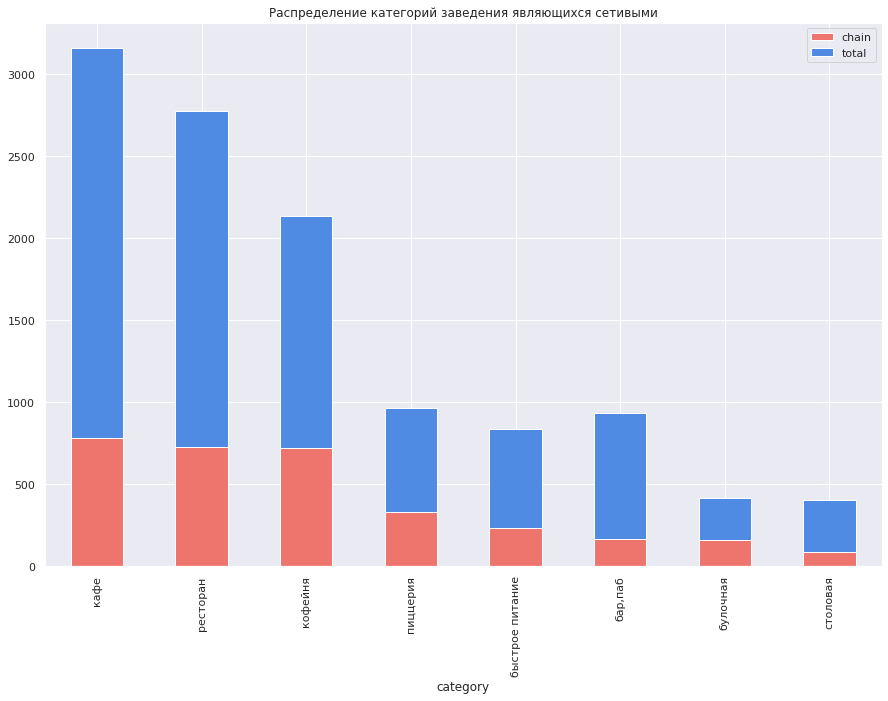

In [26]:
ax = data_chain_cat.plot.bar(
    x ='category',
    stacked=True, 
    color={"chain": "#ed756d", "total": "#4f8ae3"},
    title = 'Распределение категорий заведения являющихся сетивыми',
    #autopct='%1.0f%%',
    figsize = (15,10)
)

In [27]:
data_chain_cat['pros'] = data_chain_cat['chain']/data_chain_cat['total']
#data_chain_cat['pros'] = data_chain_cat['pros'].format({'pros':'{:.2%}'})
data_chain_cat['pros'] = data_chain_cat['pros'].mul(100).astype(int).astype(str).add('%')
data_chain_cat = data_chain_cat.sort_values('pros', ascending=True)
data_chain_cat

,category,chain,total,pros
0,"бар,паб",168,764,21%
7,столовая,88,315,27%
3,кафе,779,2376,32%
6,ресторан,729,2042,35%
2,быстрое питание,232,603,38%
4,кофейня,720,1413,50%
5,пиццерия,330,633,52%
1,булочная,157,256,61%


In [28]:
# строим столбчатую диаграмму 
fig = px.bar(data_chain_cat, # загружаем данные и заново их сортируем
             x='category', # указываем столбец с данными для оси X
             y='pros', # указываем столбец с данными для оси Y
             text='pros',# добавляем аргумент, который отобразит текст с информацией
             color='category'
             )
# оформляем график
fig.update_layout(title='Процент соотношения сетевых к общему числу заведений по категориям',
                   xaxis_title='Категории',
                   yaxis_title='Процент сетевых')
fig.show() # выводим график

3.5. Найдем топ-15 сетей по названию.

In [29]:
# готовим данные для графика
data_name_top = data.groupby('name').agg({'chain' : 'sum'})
data_name_top = data_name_top.sort_values('chain', ascending=False)
data_name_top = data_name_top.head(15)
data_name_top = pd.DataFrame(data_name_top).reset_index()
data_name_top

,name,chain
0,Шоколадница,120
1,Домино'с Пицца Пицца,76
2,Додо Пицца,74
3,One Price Coffee,71
4,Яндекс Лавка,69
5,Cofix,65
6,Prime,50
7,Хинкальная,44
8,КОФЕПОРТ,42
9,Кулинарная лавка братьев Караваевых,39


In [30]:
# строим столбчатую диаграмму 
fig = px.bar(data_name_top, # загружаем данные и заново их сортируем
             x='chain', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             text='chain',# добавляем аргумент, который отобразит текст с информацией
             color='name',
             #height=600
             )
# оформляем график
fig.update_layout(title='Топ 15 сетевых общепитов.',
                   xaxis_title='Колличество заведений',
                   yaxis_title='Название')
fig.show() # выводим график

_Самая расправстраненная сеть в Москве - это "Шоколадница", затем "Домино'с пицца" и "Додо  Пицца"._

3.6. Отабразим общее количество заведений каждой категории по районам.

In [31]:

data_district_cat = (
    data.pivot_table(index='district' , values='name', columns='category', aggfunc='count', margins=True)\
    .sort_values(by='All', ascending=True)\
    .drop('All', axis=1)\
    .drop('All')
)

data_district_cat

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Восточный административный округ,53,25,71,272,105,72,160,40
Западный административный округ,50,37,62,238,150,71,218,24
Северо-Восточный административный округ,62,28,82,269,159,68,182,40
Южный административный округ,68,25,85,264,131,73,202,44
Северный административный округ,68,39,58,234,193,77,188,41
Центральный административный округ,364,50,87,464,428,113,670,66


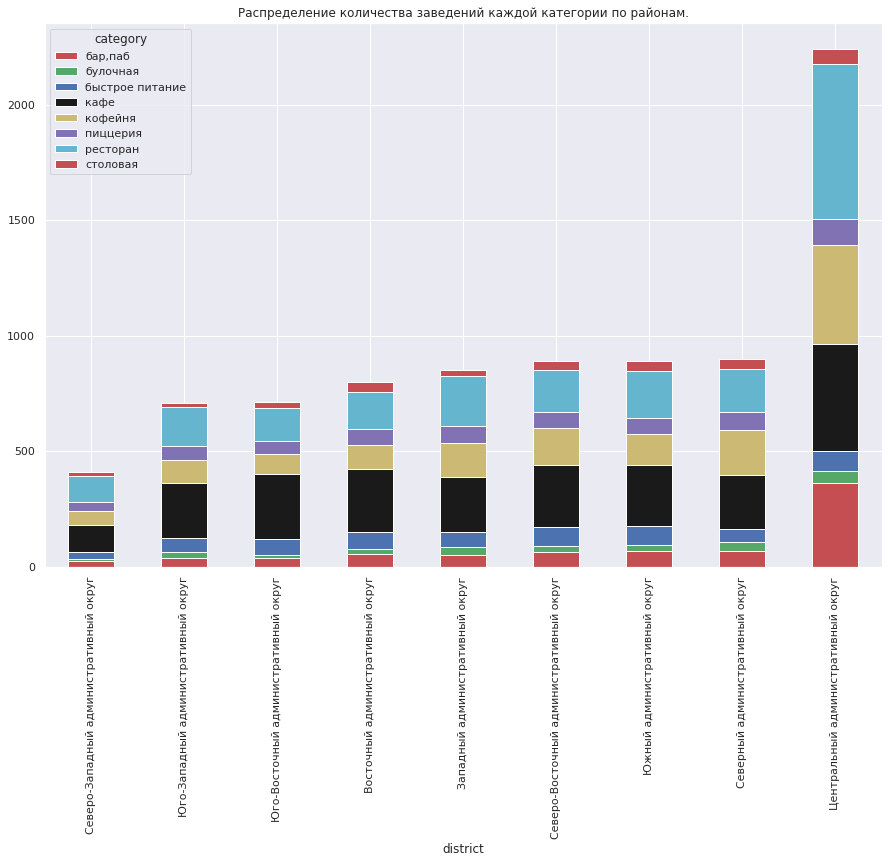

In [32]:
my_colors = 'rgbkymc'  

ax = data_district_cat.plot.bar(
    stacked=True, 
    title = 'Распределение количества заведений каждой категории по районам.',  
    figsize = (15,10),
    color=my_colors
)

In [33]:
# строим столбчатую диаграмму 
fig = px.bar(data_district_cat, # загружаем данные и заново их сортируем
             text='category',# добавляем аргумент, который отобразит текст с информацией
             color='category',
             height=800
             )
# оформляем график
fig.update_layout(title='Топ 15 сетевых общепитов.',
                   xaxis_title='Название',
                   yaxis_title='Колличество заведений')
fig.show() # выводим график

_Как не странно больше всего заведений в ЦАО и там преобладают рестораны,следом кафе и кофейни и есть намаленький процент столовых(скорее всего относящихся к бизнес центарам и торговым центрам, в других же районах лидирующую позицию занимают кафе чуть меньше кофейни затем рестораны._

3.7. Проанализируем средние рейтинги, как распределяються по районам.

In [34]:
def rating_group(rating):
    if rating < 2:
        return 1
    if 2 <= rating < 3:
        return 2
    if 3 <= rating < 4:
        return 3
    if 4 <= rating < 5:
        return 4
    return 5
data['rating_group'] = data['rating'].apply(rating_group)

data_rating_cat = (
    data.pivot_table(index='rating_group' , values='name', columns='category', aggfunc='count', margins=True)\
    .sort_values(by='All', ascending=False)\
    .drop('All', axis=1)\
    .drop('All')
)

data_rating_cat

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
rating_group,,,,,,,,
4,717,225,435,1804,1238,591,1850,269
3,32,28,131,435,122,27,145,38
2,3,1,24,75,15,7,19,3
5,7,1,6,30,37,7,15,2
1,5,1,7,32,1,1,13,3


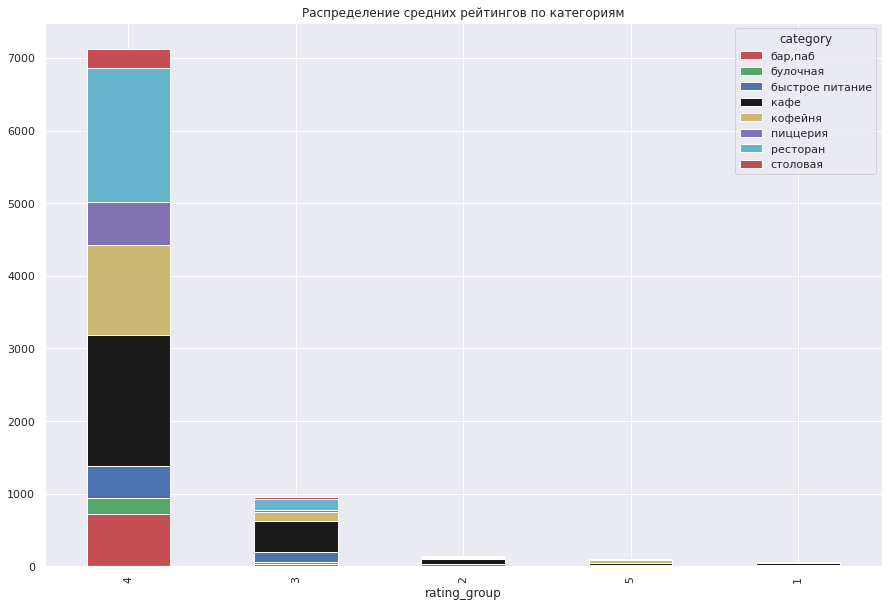

In [35]:
ax = data_rating_cat.plot.bar(
    stacked=True, 
    title = 'Распределение средних рейтингов по категориям',  
    figsize = (15,10),
    color=my_colors
)

Чаще всегоесли ставят оценку, то в пределах оценки 4. Больше всего ставят оценки ресторанам, кафе и кофейням.

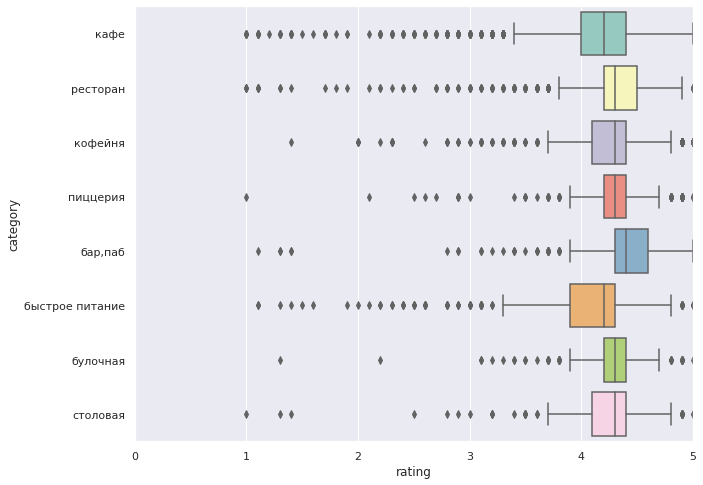

In [36]:
ax = sns.boxplot(x='rating', y='category', data=data, palette="Set3")
ax.set_xlim(0,5)
plt.show()

Самые высокие оценки у баров и пабов, самые низкие у заведений быстрого питания, но также у них есть и достаточно высокие(самый большой разброс оценок).

3.8. Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [37]:
rating_data = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_data

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [38]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

3.9. Отобразим все заведения на карте.

In [39]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

3.10. Найдем топ-15 улиц по количеству заведений.

In [40]:
data_street_cat = (
    data.pivot_table(index='street' , values='name', columns='category', aggfunc='count', margins=True)\
    .sort_values(by='All', ascending=False)\
    .drop('All', axis=1)\
    .drop('All')
)
data_street_cat = data_street_cat.fillna(value=0)
data_street_cat.columns = ['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']

data_street_cat_15 = data_street_cat.head(15)
data_street_cat_15

,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
проспект Мира,11.00,4.00,21.00,53.00,36.00,11.00,45.00,2.00
Профсоюзная улица,6.00,4.00,15.00,35.00,18.00,15.00,26.00,3.00
проспект Вернадского,7.00,1.00,12.00,25.00,16.00,12.00,33.00,2.00
Ленинский проспект,10.00,3.00,2.00,26.00,23.00,5.00,33.00,5.00
Ленинградский проспект,15.00,4.00,2.00,12.00,25.00,9.00,25.00,3.00
Дмитровское шоссе,6.00,2.00,10.00,23.00,11.00,8.00,24.00,4.00
Каширское шоссе,2.00,0.00,10.00,20.00,16.00,5.00,19.00,5.00
Варшавское шоссе,6.00,0.00,7.00,18.00,14.00,4.00,20.00,7.00
Ленинградское шоссе,5.00,2.00,5.00,13.00,13.00,3.00,26.00,3.00


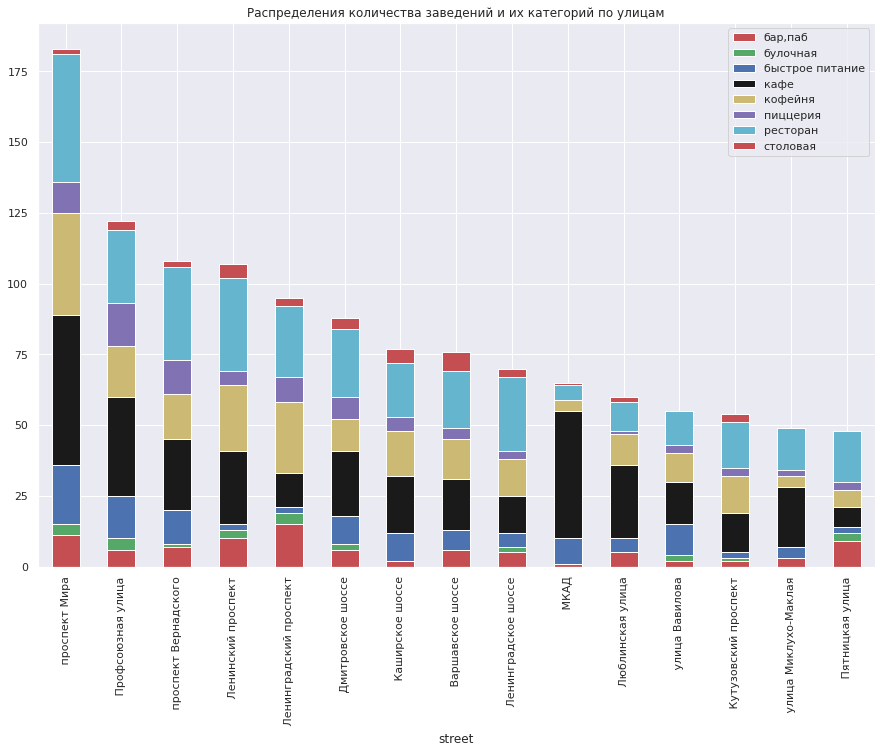

In [41]:
ax = data_street_cat_15.plot.bar(
    stacked=True, 
    title = 'Распределения количества заведений и их категорий по улицам',  
    figsize = (15,10),
    color=my_colors
)

_Одна из самыж длинных и многолюдных улиц города - это просмект Мира, там всех больше заведений. Распределение везде примерно похожее по топу улиц,сильно выжеляется МКАД, там оченьбольшой процент кафе._

3.11. Найдем улицы, на которых находится только один объект общепита..

In [42]:
data_street_cat['сумма'] = data_street_cat['бар,паб'] + data_street_cat['булочная'] + data_street_cat['быстрое питание'] + data_street_cat['кафе'] + data_street_cat['кофейня'] + data_street_cat['пиццерия'] + data_street_cat['ресторан'] + data_street_cat['столовая']
data_street_cat_1 = data_street_cat.loc[data_street_cat['сумма']==1]
print('Всего по 1 заведению на улицу:', data_street_cat_1['булочная'].count())

Всего по 1 заведению на улицу: 459


In [43]:
print('Всего по 1 заведению на улицу из категории бар,паб:', data_street_cat_1['бар,паб'].sum())
print('Всего по 1 заведению на улицу из категории булочная:', data_street_cat_1['булочная'].sum())
print('Всего по 1 заведению на улицу из категории быстрое питание:', data_street_cat_1['быстрое питание'].sum())
print('Всего по 1 заведению на улицу из категории кафе:', data_street_cat_1['кафе'].sum())
print('Всего по 1 заведению на улицу из категории кофейня:', data_street_cat_1['кофейня'].sum())
print('Всего по 1 заведению на улицу из категории пиццерия:', data_street_cat_1['пиццерия'].sum())
print('Всего по 1 заведению на улицу из категории ресторан:', data_street_cat_1['ресторан'].sum())
print('Всего по 1 заведению на улицу из категории столовая:', data_street_cat_1['столовая'].sum())


Всего по 1 заведению на улицу из категории бар,паб: 39.0
Всего по 1 заведению на улицу из категории булочная: 8.0
Всего по 1 заведению на улицу из категории быстрое питание: 23.0
Всего по 1 заведению на улицу из категории кафе: 160.0
Всего по 1 заведению на улицу из категории кофейня: 84.0
Всего по 1 заведению на улицу из категории пиццерия: 15.0
Всего по 1 заведению на улицу из категории ресторан: 94.0
Всего по 1 заведению на улицу из категории столовая: 36.0


In [44]:
data_street_cat_1

,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,сумма
street,,,,,,,,,
улица 8 Марта,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00
улица Климашкина,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00
улица Клочкова,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00
улица Николая Химушина,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1.00
улица 800-летия Москвы,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00
...,...,...,...,...,...,...,...,...,...
Павелецкая набережная,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,1.00
Панкратьевский переулок,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00
Парусный проезд,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00


В основном эты кафе находятся на слишком узких улицах или рядом с парками (внутри парков). Чаще всего это Кафе, есть еще 94 таких ресторанов и 84 кафейни.  

3.12. Посчитайте медиану столбца "middle_avg_bill"(средний чек) для каждого района..

In [45]:
middle_avg_bill_m = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
middle_avg_bill_m.columns=['district', 'middle_avg_bill']
middle_avg_bill_m.sort_values(by='middle_avg_bill', ascending=False)


,district,middle_avg_bill
1,Западный административный округ,"1,000.00"
5,Центральный административный округ,"1,000.00"
4,Северо-Западный административный округ,700.00
2,Северный административный округ,650.00
7,Юго-Западный административный округ,600.00
0,Восточный административный округ,575.00
3,Северо-Восточный административный округ,500.00
8,Южный административный округ,500.00
6,Юго-Восточный административный округ,450.00


In [46]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill_m,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самые дорогие заведения находяться в центре и в ЗАО(наверно во всем виновата рублевка), в ЗАО находиться много элитных районов.
Самые дешевые цены в ЮВАО и СВАО. Возможно это связано с тем, что там много парков(меньше заведений), и не так много элитного жилья.

3.13.  Ночные часы работы.

In [47]:
is_all = data.groupby('district', as_index=False)['is_24_7'].agg('count')
is_all.columns=['district', 'middle_avg_bill']
is_all.sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill
5,Центральный административный округ,2242
2,Северный административный округ,898
8,Южный административный округ,892
3,Северо-Восточный административный округ,890
1,Западный административный округ,850
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


__Вывод__

_Больше вскего в Москве кафе, кафеен и ресторанов, восновном на 40, 100 и 60 мест, они же чеще встречаются в категории сетевых заведений. Самые распространенные сети это "Шоколад", "Доминос Пицца", "Додо пицца". Но большенство заведений не сетевые. В центре нажодиться больше всего заведений,в основном это рестораны потом кафе и кафейни. По остальным райнам на первом месте кафе, рестораны и кофейни.
Оценки чаще всего ставят от 4 до 5 и большенство в ЦАО. 5 ки предпочитают ставить кафейням. 
Нв самых протяженных проспектах, таких как проспект Мира, Пролетарский и пр-т Вернадского. Основная часть круглосуточных заведений находиться в центре._

4.  Детализируем исследование: открытие кофейни

4.1 Проанализируем ситуацию с кофейнями.

In [48]:
frends = data.query('category == "кофейня"')
frends = frends.reset_index()

print('Всего кофеен:', frends['category'].count())

Всего кофеен: 1413


In [49]:
frends_dist = frends.groupby('district', as_index=False)['category'].agg('count')\
    .sort_values(by='category', ascending=False)
frends_dist

,district,category
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [50]:
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=frends_dist['district'],# указываем значения, которые появятся на метках сегментов
                             values=frends_dist['category'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Распределение кафеен по районам.', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
)

fig.show() # выводим график

_Основная часть кофеен расположена в центре_

4.2 Есть ли круглосуточные кофейни.

In [51]:
frends_24 = frends.query('is_24_7 == True')
print('Всего круглосуточных кофеен:', frends_24['name'].count())

Всего круглосуточных кофеен: 59


4.3 Какой средний рейтинг.

In [52]:
rating_frends = frends.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=False)
rating_frends

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
7,Юго-Западный административный округ,4.28
0,Восточный административный округ,4.28
8,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


In [53]:

# создаём карту Москвы
ma = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_frends,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам среди кофеен',
).add_to(ma)

# выводим карту
ma

4.4 Какая средняя цена чашки кофе в зависимости от рейтинга.

In [54]:
rating_frends_cup = frends.groupby('rating', as_index=False)['middle_coffee_cup'].agg('mean')
rating_frends_cup = rating_frends_cup.fillna(0)
rating_frends_cup = rating_frends_cup.loc[rating_frends_cup['middle_coffee_cup'] != 0]
rating_frends_cup

,rating,middle_coffee_cup
1,2.00,77.50
6,2.90,100.00
7,3.00,150.00
8,3.10,80.00
10,3.30,149.50
11,3.40,135.00
13,3.60,79.00
14,3.70,170.50
15,3.80,145.00
16,3.90,127.38


In [55]:
# строим столбчатую диаграмму 
fig = px.bar(rating_frends_cup, # загружаем данные и заново их сортируем
             x='rating', # указываем столбец с данными для оси X
             y='middle_coffee_cup', # указываем столбец с данными для оси Y
             text='rating',# добавляем аргумент, который отобразит текст с информацией
             color='rating'
             )
# оформляем график
fig.update_layout(title='Взаимосвязь рейтинга и цены за чашку кофе',
                   xaxis_title='Рейтинг',
                   yaxis_title='Цена')
fig.show() # выводим график

У рейтингов меньше 3,6 цена на кофе уже не поднимается выше 150 р., скорее всего это дешевые кофейни, с мин вложением. Нас интересуют рейтинго от 4,5 до 5 в этом пределе средняя цена от 160 - 180 р. На это я считаю и надо ориентироваться, чтобы было и качественное сырье и атоматы хорошие, и цена могла окупить вложение и чтобы не сильно дорого для клиентов(т.к. ориентируемся на студентов и молодых специалистов до 35 лет) 

4.5 Какая средняя цена чашки кофе в зависимости от района.

In [56]:
district_frends_cup = frends.groupby('district', as_index=False)['middle_coffee_cup'].agg('meвшan')\
    .sort_values(by='middle_coffee_cup', ascending=False)

district_frends_cup

AttributeError: 'meвшan' is not a valid function for 'DataFrameGroupBy' object

In [ ]:
# создаём карту Москвы
my = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_frends_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    legend_name='Среднее значение чашки кофе в кофейнях по районам',
).add_to(my)

# выводим карту
my

_Всего в Москве 1413 кафеен, онавная часть расположена в ЦАО из них круглосуточных 59. Саные низкая цена на чашку кофе в ЗАО. самая высокая оценка кофеен с средней ценой за кофе 160 руб. а также 150 руб и в промежутке от 174 до 185 руб. Самые высокие цены  в ЮЗАО, ЦАО и ЗАО, самые низкие в ВАО.(возможно связано с качеством кафе, но это не сильно влияет на рейтинг.)_

__Москва город возможностей, где кофейню не открой, там будет народ. Но если это кофейня в стиле "Друзей", то лучше выбрать не ЦАО, а поближе к спальным районам, чтобы вечером друзья все вместе могли там встречаться. Я бы предложила начать либо с ЮЗАО, либо с СЗАО. На южной стороне Москвы есть много и элитного жилья и университеты и красивые проспекты, где можно подобрать подешевле помещение, чем в центре, при этом людям будет удобнее после работы приходить. Цену на чашку кофе лучше выбрать около 160-180 руб. т.к. главной ценностью этой кофейни должна быть атмосфера и конечно живая музыка.__

Ссылка на презентацию: https://disk.yandex.ru/i/ANHv_2DxHheNFw